In [4]:
import pandas as pd
import numpy as np
import os
import glob
from glob import glob
import PIL
import random
import shutil
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [5]:
# Download the Data through Kaggle API
from google.colab import files

In [6]:
# Using Kaggle API to Download the Dataset

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

# Then move kaggle.json into the folder where the API expects to find it.
!mkdir -p ~/.kaggle/ && mv kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json
User uploaded file "kaggle.json" with length 67 bytes


In [7]:
# Download the Dataset
!kaggle datasets download -d csafrit2/plant-leaves-for-image-classification

100% 6.55G/6.56G [01:07<00:00, 28.1MB/s]
100% 6.56G/6.56G [01:07<00:00, 104MB/s] 


In [8]:
from zipfile import ZipFile
file_name = "/content/plant-leaves-for-image-classification.zip"
with ZipFile(file_name,'r') as zip:
  zip.extractall()
  print('Done')
  zip.extractall(path="/content")

Done


In [9]:
# We send some random train images from each and every classes to test folder with respective of classes
# It will help us to dataset imbalance to preventing from overfitting


train_path = "/content/Plants_2/train/"
test_path = "/content/Plants_2/test/"
test_size = 0.2 # fraction of images to move to test folder

for folder_name in os.listdir(train_path):
    folder_path = os.path.join(train_path, folder_name)
    if os.path.isdir(folder_path):
        test_folder_path = os.path.join(test_path, folder_name)
        if not os.path.exists(test_folder_path):
            os.makedirs(test_folder_path)
        filenames = os.listdir(folder_path)
        random.shuffle(filenames)
        test_count = int(len(filenames) * test_size)
        test_files = filenames[:test_count]
        for file_name in test_files:
            file_path = os.path.join(folder_path, file_name)
            shutil.move(file_path, os.path.join(test_folder_path, file_name))


In [10]:
for folder_path in [train_path, test_path]:
    print('Folder:', folder_path)
    # Iterate through each subfolder
    for subfolder_name in os.listdir(folder_path):
        subfolder_path = os.path.join(folder_path, subfolder_name)
        # Count the number of images in the subfolder
        num_images = len(os.listdir(subfolder_path))
        print('    Subfolder:', subfolder_name, '- Num images:', num_images)


Folder: /content/Plants_2/train/
    Subfolder: Gauva healthy (P3a) - Num images: 214
    Subfolder: Chinar healthy (P11a) - Num images: 75
    Subfolder: Lemon healthy (P10a) - Num images: 120
    Subfolder: Jamun healthy (P5a) - Num images: 215
    Subfolder: Alstonia Scholaris healthy (P2b) - Num images: 135
    Subfolder: Pongamia Pinnata healthy (P7a) - Num images: 250
    Subfolder: Pongamia Pinnata diseased (P7b) - Num images: 212
    Subfolder: Jatropha healthy (P6a) - Num images: 99
    Subfolder: Mango diseased (P0b) - Num images: 204
    Subfolder: Bael diseased (P4b) - Num images: 86
    Subfolder: Basil healthy (P8) - Num images: 110
    Subfolder: Alstonia Scholaris diseased (P2a) - Num images: 196
    Subfolder: Mango healthy (P0a) - Num images: 128
    Subfolder: Arjun diseased (P1a) - Num images: 178
    Subfolder: Jatropha diseased (P6b) - Num images: 92
    Subfolder: Lemon diseased (P10b) - Num images: 54
    Subfolder: Gauva diseased (P3b) - Num images: 105
    Sub

In [11]:
# Define the maximum number of images to keep in each subfolder of train and test directories
train_max_count = 100
test_max_count = 20

# Define the paths to the train and test directories
train_path = "/content/Plants_2/train"
test_path = "/content/Plants_2/test"


# Loop through each subdirectory in the train directory and delete all but train_max_count number of images
for sub_dir in os.listdir(train_path):
    sub_dir_path = os.path.join(train_path, sub_dir)
    if os.path.isdir(sub_dir_path):
        images_list = os.listdir(sub_dir_path)
        images_count = len(images_list)
        if images_count > train_max_count:
            images_to_delete = random.sample(images_list, images_count - train_max_count)
            for image_file in images_to_delete:
                os.remove(os.path.join(sub_dir_path, image_file))

# Loop through each subdirectory in the test directory and delete all but test_max_count number of images
for sub_dir in os.listdir(test_path):
    sub_dir_path = os.path.join(test_path, sub_dir)
    if os.path.isdir(sub_dir_path):
        images_list = os.listdir(sub_dir_path)
        images_count = len(images_list)
        if images_count > test_max_count:
            images_to_delete = random.sample(images_list, images_count - test_max_count)
            for image_file in images_to_delete:
                os.remove(os.path.join(sub_dir_path, image_file))


In [12]:
for folder_path in [train_path, test_path]:
    print('Folder:', folder_path)
    # Iterate through each subfolder
    for subfolder_name in os.listdir(folder_path):
        subfolder_path = os.path.join(folder_path, subfolder_name)
        # Count the number of images in the subfolder
        num_images = len(os.listdir(subfolder_path))
        print('    Subfolder:', subfolder_name, '- Num images:', num_images)


Folder: /content/Plants_2/train
    Subfolder: Gauva healthy (P3a) - Num images: 100
    Subfolder: Chinar healthy (P11a) - Num images: 75
    Subfolder: Lemon healthy (P10a) - Num images: 100
    Subfolder: Jamun healthy (P5a) - Num images: 100
    Subfolder: Alstonia Scholaris healthy (P2b) - Num images: 100
    Subfolder: Pongamia Pinnata healthy (P7a) - Num images: 100
    Subfolder: Pongamia Pinnata diseased (P7b) - Num images: 100
    Subfolder: Jatropha healthy (P6a) - Num images: 99
    Subfolder: Mango diseased (P0b) - Num images: 100
    Subfolder: Bael diseased (P4b) - Num images: 86
    Subfolder: Basil healthy (P8) - Num images: 100
    Subfolder: Alstonia Scholaris diseased (P2a) - Num images: 100
    Subfolder: Mango healthy (P0a) - Num images: 100
    Subfolder: Arjun diseased (P1a) - Num images: 100
    Subfolder: Jatropha diseased (P6b) - Num images: 92
    Subfolder: Lemon diseased (P10b) - Num images: 54
    Subfolder: Gauva diseased (P3b) - Num images: 100
    Subf

Folder: /content/Plants_2/train


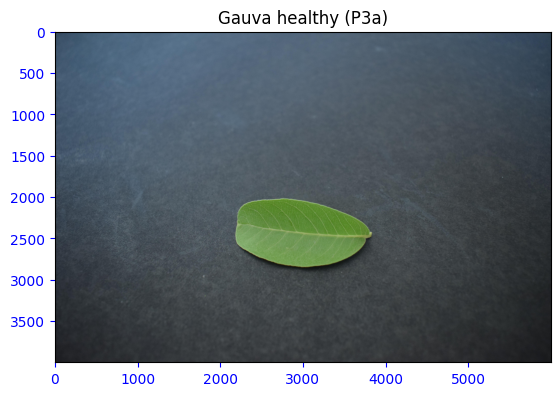

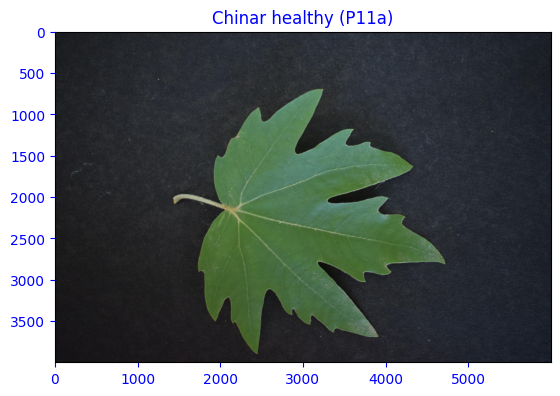

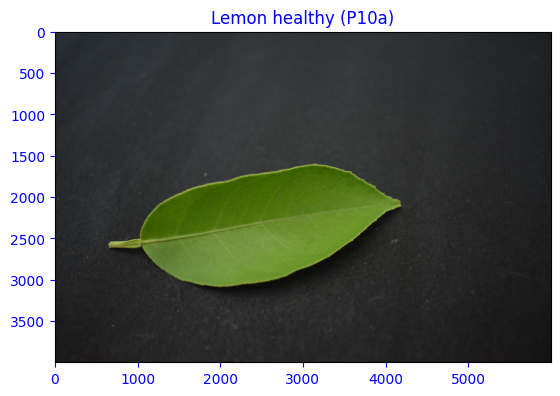

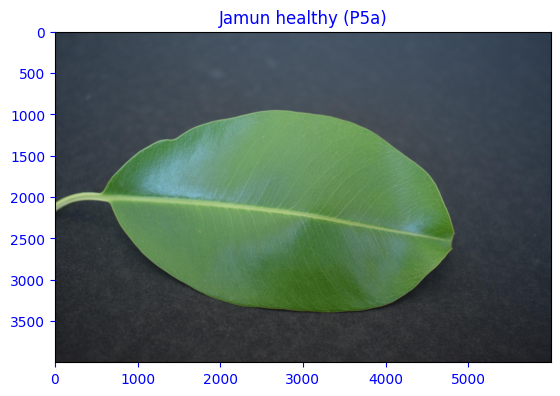

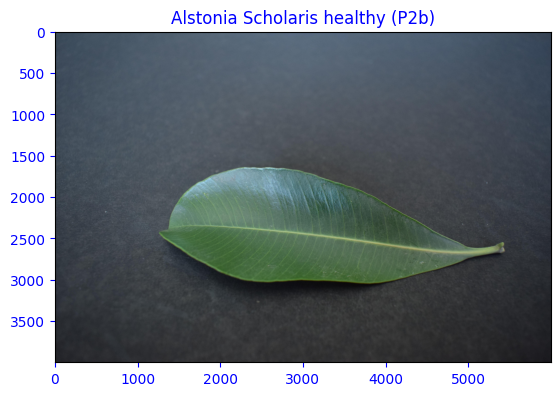

...

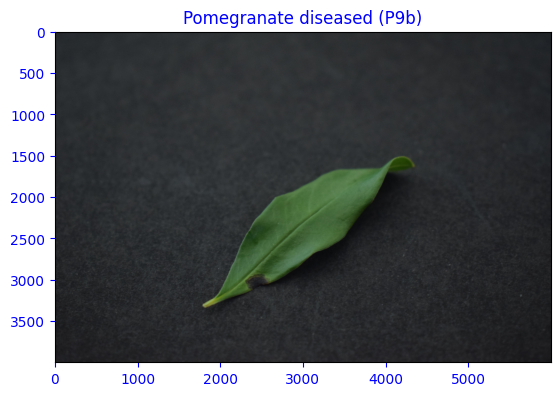

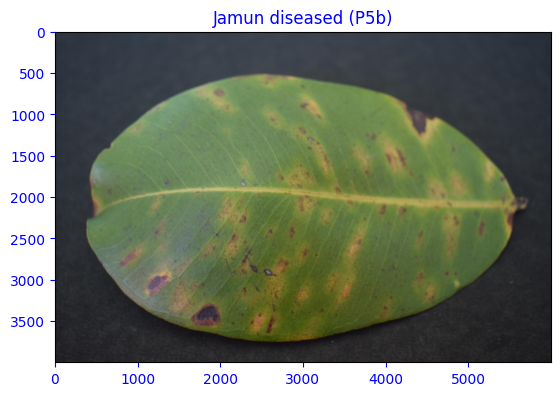

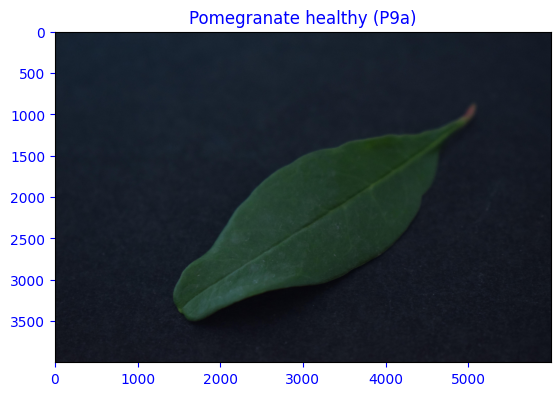

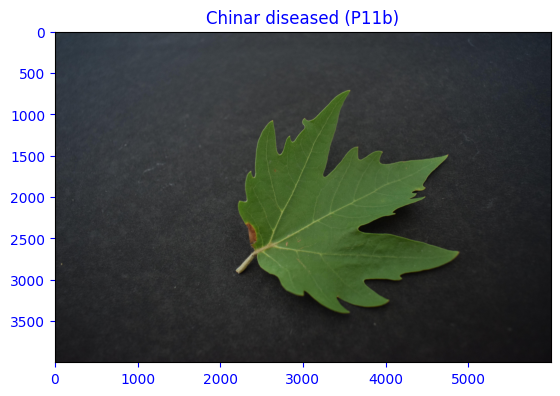

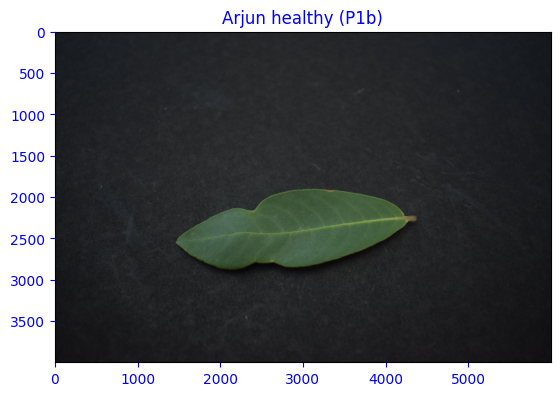

Folder: /content/Plants_2/test


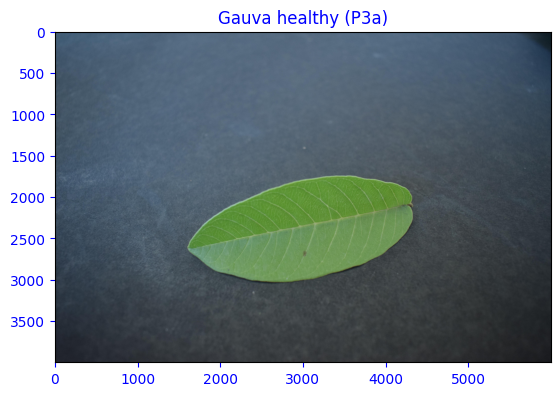

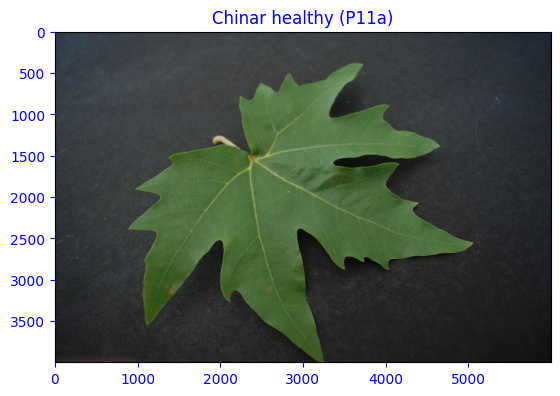

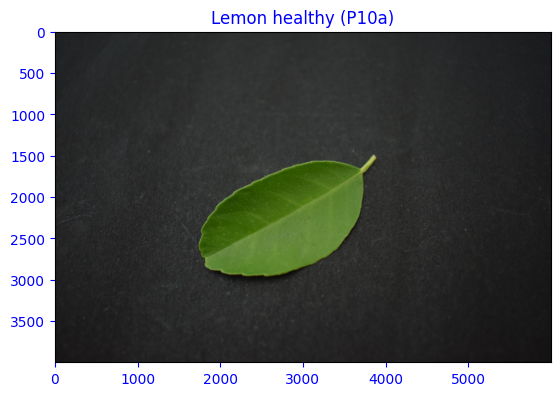

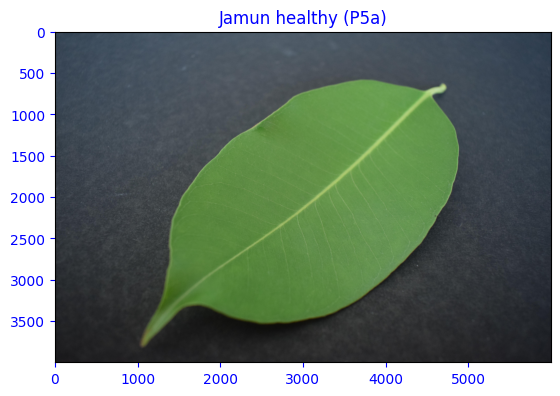

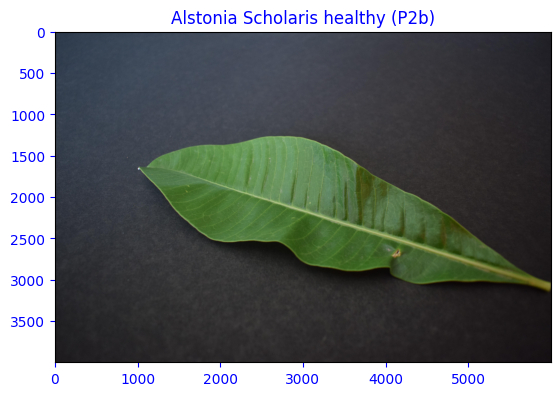

...

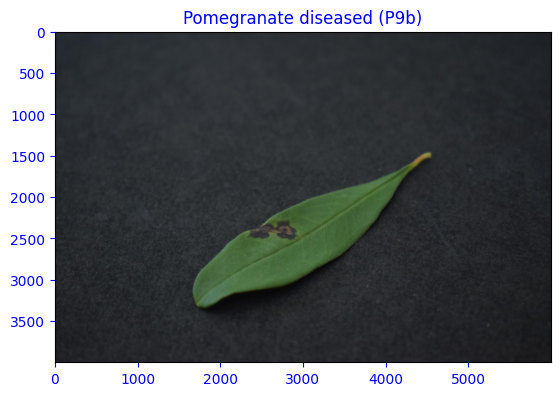

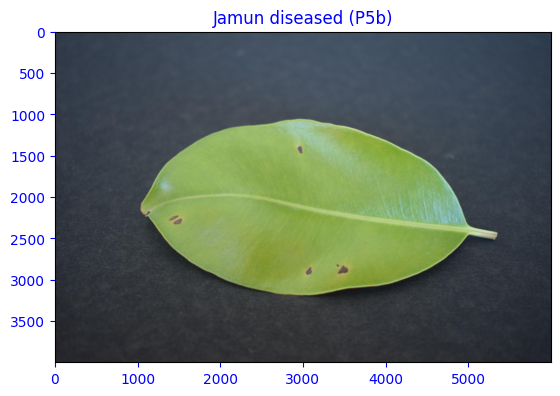

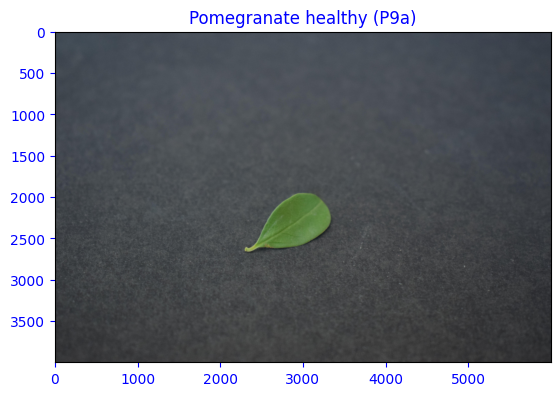

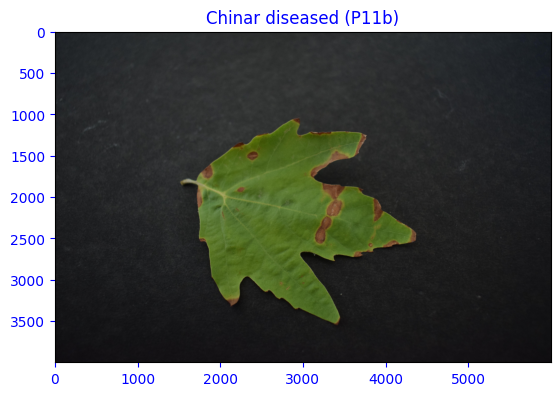

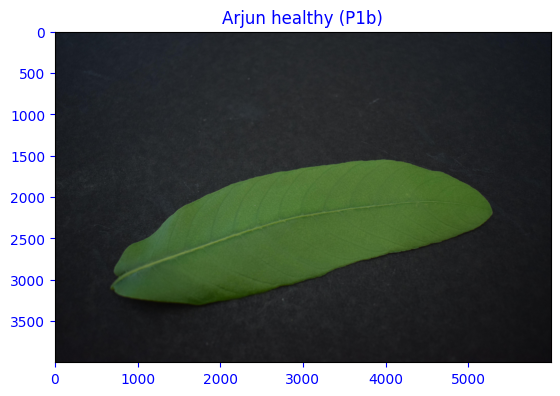

In [13]:
# Define the number of random images to display from each subfolder
num_images_to_display = 1

# Iterate through the train and test folders
for folder_path in [train_path, test_path]:
    print('Folder:', folder_path)
    # Iterate through each subfolder
    for subfolder_name in os.listdir(folder_path):
        subfolder_path = os.path.join(folder_path, subfolder_name)
        # Count the number of images in the subfolder
        num_images = len(os.listdir(subfolder_path))
        # Select some random images to display
        image_names = random.sample(os.listdir(subfolder_path), num_images_to_display)
        # Display the images
        for image_name in image_names:
            image_path = os.path.join(subfolder_path, image_name)
            image = mpimg.imread(image_path)
            plt.imshow(image)
            plt.rcParams['text.color'] = 'blue'
            plt.tick_params(axis='x', colors='blue')
            plt.tick_params(axis='y', colors='blue')
            plt.title(subfolder_name)
            plt.show()


In [14]:
batch_size = 64
img_height = 224
img_width = 224

In [15]:
diseases = os.listdir(train_path)
print(diseases)

['Gauva healthy (P3a)', 'Chinar healthy (P11a)', 'Lemon healthy (P10a)', 'Jamun healthy (P5a)', 'Alstonia Scholaris healthy (P2b)', 'Pongamia Pinnata healthy (P7a)', 'Pongamia Pinnata diseased (P7b)', 'Jatropha healthy (P6a)', 'Mango diseased (P0b)', 'Bael diseased (P4b)', 'Basil healthy (P8)', 'Alstonia Scholaris diseased (P2a)', 'Mango healthy (P0a)', 'Arjun diseased (P1a)', 'Jatropha diseased (P6b)', 'Lemon diseased (P10b)', 'Gauva diseased (P3b)', 'Pomegranate diseased (P9b)', 'Jamun diseased (P5b)', 'Pomegranate healthy (P9a)', 'Chinar diseased (P11b)', 'Arjun healthy (P1b)']


In [16]:
print("Total disease classes are: {}".format(len(diseases)))

Total disease classes are: 22


In [17]:
plants = []
NumberOfDiseases = 0
for plant in diseases:
    if plant.split(' ')[0] not in plants:
        plants.append(plant.split(' ')[0])
    if plant.split(' ')[1] != 'healthy':
        NumberOfDiseases += 1

In [18]:
print(f"Unique Plants are: \n{plants}")

Unique Plants are: 
['Gauva', 'Chinar', 'Lemon', 'Jamun', 'Alstonia', 'Pongamia', 'Jatropha', 'Mango', 'Bael', 'Basil', 'Arjun', 'Pomegranate']


In [19]:
print("Number of plants: {}".format(len(plants)))

Number of plants: 12


In [20]:
# Number of images for each disease
nums = {}
for disease in diseases:
    nums[disease] = len(os.listdir(train_path + '/' + disease))

# converting the nums dictionary to pandas dataframe passing index as plant name and number of images as column

img_per_class = pd.DataFrame(nums.values(), index=nums.keys(), columns=["no. of images"])
img_per_class

,no. of images
Gauva healthy (P3a),100
Chinar healthy (P11a),75
Lemon healthy (P10a),100
Jamun healthy (P5a),100
Alstonia Scholaris healthy (P2b),100
Pongamia Pinnata healthy (P7a),100
Pongamia Pinnata diseased (P7b),100
Jatropha healthy (P6a),99
Mango diseased (P0b),100
Bael diseased (P4b),86


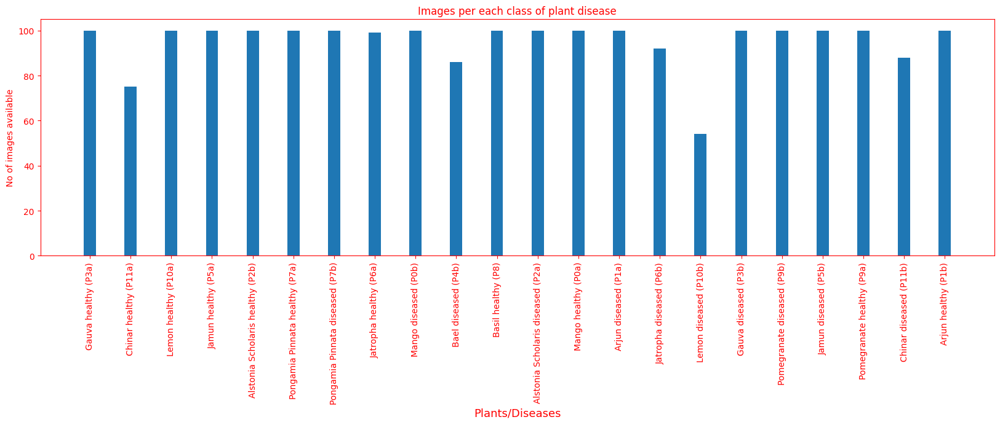

In [21]:
# plotting number of images available for each disease
index = [n for n in range(22)]
plt.figure(figsize=(20, 5))
plt.bar(index, [n for n in nums.values()], width=0.3)
plt.xlabel('Plants/Diseases', fontsize=13, color='red')
plt.ylabel('No of images available', fontsize=10, color='red')
plt.xticks(index, diseases, fontsize=10, rotation=90, color='red')
plt.title('Images per each class of plant disease', color='red')
plt.gca().spines['bottom'].set_color('red')
plt.gca().spines['top'].set_color('red')
plt.gca().spines['right'].set_color('red')
plt.gca().spines['left'].set_color('red')
plt.tick_params(axis='x', colors='red')
plt.tick_params(axis='y', colors='red')
plt.show()

In [22]:
def get_files(directory):
  if not os.path.exists(directory):
    return 0
  count=0
  # crawls inside folders
  for current_path,dirs,files in os.walk(directory):
    for dr in dirs:
      count+= len(glob.glob(os.path.join(current_path,dr+"/*")))
  return count
train_path ="/content/Plants_2/train"
test_path="/content/Plants_2/test"

#train file image count
train_samples =get_files(train_path)
#to get tags
num_classes=len(glob.glob(train_path+"/*"))
#test file image count
test_samples=get_files(test_path)
print(num_classes,"Classes")
print(train_samples,"Train images")
print(test_samples,"Test images")

22 Classes
2094 Train images
438 Test images


In [23]:
import pathlib
train_dir = "/content/Plants_2/train/"
data_dir = pathlib.Path(train_dir)

In [24]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 2094 files belonging to 22 classes.
Using 1676 files for training.


In [25]:
test_dir = "/content/Plants_2/test"
data_dir = pathlib.Path(test_dir)

In [26]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 438 files belonging to 22 classes.
Using 87 files for validation.


In [27]:
class_names = train_ds.class_names
print(class_names)

['Alstonia Scholaris diseased (P2a)', 'Alstonia Scholaris healthy (P2b)', 'Arjun diseased (P1a)', 'Arjun healthy (P1b)', 'Bael diseased (P4b)', 'Basil healthy (P8)', 'Chinar diseased (P11b)', 'Chinar healthy (P11a)', 'Gauva diseased (P3b)', 'Gauva healthy (P3a)', 'Jamun diseased (P5b)', 'Jamun healthy (P5a)', 'Jatropha diseased (P6b)', 'Jatropha healthy (P6a)', 'Lemon diseased (P10b)', 'Lemon healthy (P10a)', 'Mango diseased (P0b)', 'Mango healthy (P0a)', 'Pomegranate diseased (P9b)', 'Pomegranate healthy (P9a)', 'Pongamia Pinnata diseased (P7b)', 'Pongamia Pinnata healthy (P7a)']


In [28]:
n_train = 0
for value in nums.values():
    n_train += value
print(f"There are {n_train} images for training")

There are 2094 images for training


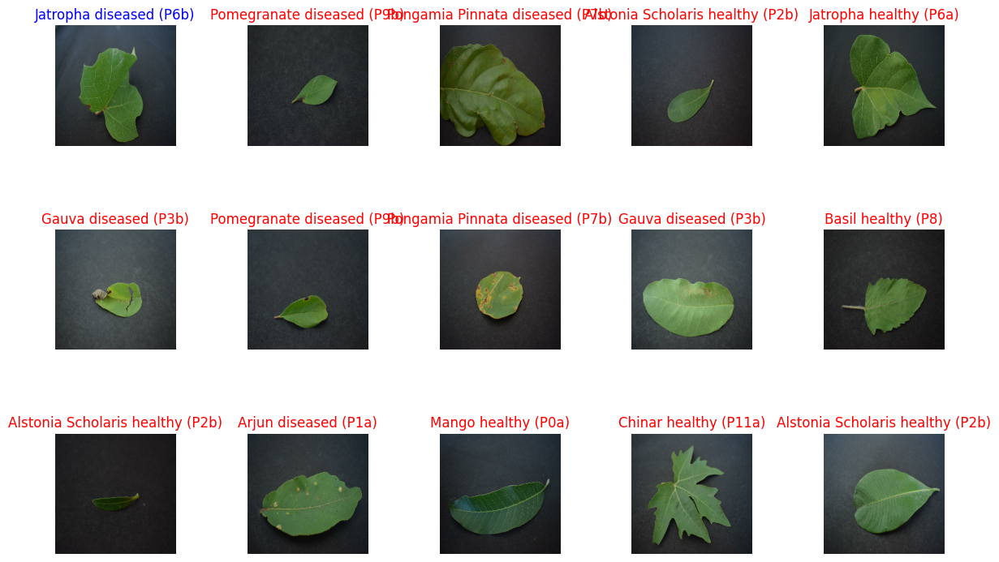

In [29]:
# Visualize the data
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 15))
for images, labels in train_ds.take(1):
  for i in range(15):
    ax = plt.subplot(5, 5, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")
    plt.rcParams['text.color'] = 'red'
    plt.tick_params(axis='x', colors='red')
    plt.tick_params(axis='y', colors='red')


plt.subplots_adjust(wspace=0.1, hspace=0.7)
plt.show()


In [ ]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

In [31]:
!pip install keras-tuner

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.1/176.1 kB 3.8 MB/s eta 0:00:00


In [32]:
import tensorflow as tf
from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.inception_v3 import InceptionV3

# Set the input image size
img_size = (224, 224, 3)

# Set the batch size
batch_size = 64

# Set the number of epochs
epochs = 5

# Create the data generators
train_datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.inception_v3.preprocess_input)
test_datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.inception_v3.preprocess_input)

train_generator = train_datagen.flow_from_directory(
    '/content/Plants_2/train/',
    target_size=img_size[:2],
    batch_size=batch_size,
    class_mode='categorical')

test_generator = test_datagen.flow_from_directory(
    '/content/Plants_2//test',
    target_size=img_size[:2],
    batch_size=batch_size,
    class_mode='categorical')

# Create the model
base_model = InceptionV3(input_shape=img_size, include_top=False, weights='imagenet')

for layer in base_model.layers:
    layer.trainable = False

model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(train_generator.num_classes, activation='softmax')
])

# Compile the model
model.compile(optimizer=Adam(lr=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
history = model.fit(train_generator,
                    epochs=epochs,
                    validation_data=test_generator)

# Print the accuracy and loss values
print('Train accuracy:', history.history['accuracy'][-1])
print('Validation accuracy:', history.history['val_accuracy'][-1])
print('Train loss:', history.history['loss'][-1])
print('Validation loss:', history.history['val_loss'][-1])


Found 2094 images belonging to 22 classes.
Found 438 images belonging to 22 classes.
87910968/87910968 [==============================] - 0s 0us/step


Epoch 1/5
33/33 [==============================] - 352s 10s/step - loss: 2.1173 - accuracy: 0.3959 - val_loss: 1.3244 - val_accuracy: 0.6073
Epoch 2/5
33/33 [==============================] - 285s 9s/step - loss: 0.9747 - accuracy: 0.7173 - val_loss: 0.9549 - val_accuracy: 0.7169
Epoch 3/5
33/33 [==============================] - 276s 8s/step - loss: 0.7112 - accuracy: 0.7999 - val_loss: 0.7937 - val_accuracy: 0.7808
Epoch 4/5
33/33 [==============================] - 270s 8s/step - loss: 0.5734 - accuracy: 0.8362 - val_loss: 0.7097 - val_accuracy: 0.7900
Epoch 5/5
33/33 [==============================] - 272s 8s/step - loss: 0.4760 - accuracy: 0.8734 - val_loss: 0.6535 - val_accuracy: 0.7945
Train accuracy: 0.8734479546546936
Validation accuracy: 0.7945205569267273
Train loss: 0.47603943943977356
Validation loss: 0.6535052061080933


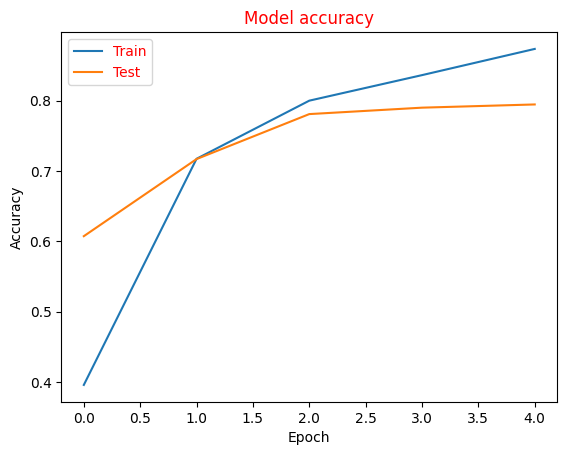

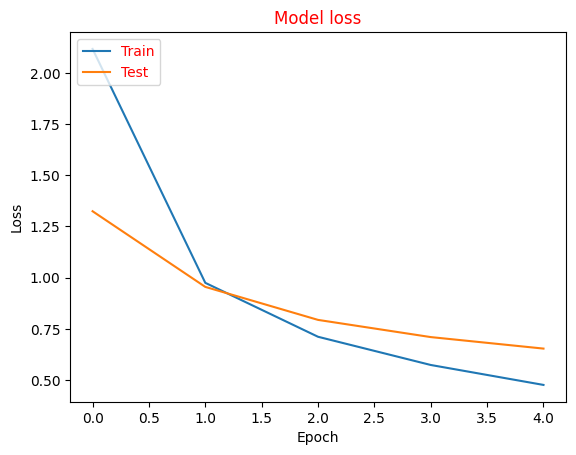

In [33]:
# Plot the accuracy values
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

# Plot the loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()


In [34]:
# set parameter values for increase accuracy and decrease loss value

data_augmentation = keras.Sequential(
    [
        layers.RandomFlip("horizontal",
                           input_shape=(img_height, img_width, 3)),
        layers.RandomRotation(0.3),  # increased rotation angle
        layers.RandomZoom(0.3),  # increased zoom range
        layers.RandomContrast(0.3),  # added contrast adjustment
        layers.RandomBrightness(0.3),  # added brightness adjustment
    ]
)


In [35]:
import tensorflow as tf
from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.inception_v3 import InceptionV3
from kerastuner.tuners import RandomSearch

# Set the input image size
img_size = (224, 224, 3)

# Set the batch size
batch_size = 64

# Set the number of epochs
epochs = 5

# Create the data generators
train_datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.inception_v3.preprocess_input)
test_datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.inception_v3.preprocess_input)

train_generator = train_datagen.flow_from_directory(
    '/content/Plants_2/train/',
    target_size=img_size[:2],
    batch_size=batch_size,
    class_mode='categorical')

test_generator = test_datagen.flow_from_directory(
    '/content/Plants_2/test',
    target_size=img_size[:2],
    batch_size=batch_size,
    class_mode='categorical')



# Define a function to build the model
def build_model(hp):
    base_model = InceptionV3(input_shape=img_size, include_top=False, weights='imagenet')

    for layer in base_model.layers:
        layer.trainable = False

    model = Sequential([
        base_model,
        GlobalAveragePooling2D(),
        Dense(train_generator.num_classes, activation='softmax')
    ])

    # Tune the learning rate
    hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4, 1e-5])

    # Add dropout layers
    hp_dropout_rate = hp.Float('dropout_rate', min_value=0.2, max_value=0.8, step=0.1)
    model.add(tf.keras.layers.Dropout(rate=hp_dropout_rate))

    model.compile(optimizer=Adam(lr=hp_learning_rate),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    return model


# Define the tuner
tuner = RandomSearch(
    build_model,
    objective='val_accuracy',
    max_trials=1,
    executions_per_trial=1,
    directory='hyperparameter_tuning',
    project_name='plants_classification')

# Perform hyperparameter search
tuner.search(train_generator,
             epochs=epochs,
             validation_data=test_generator)

# Retrieve the best model
best_model = tuner.get_best_models(1)[0]

# Train the best model
best_model.fit(train_generator,
               epochs=epochs,
               validation_data=test_generator)

# Print the accuracy and loss values of the best model
best_model.evaluate(test_generator)



Trial 1 Complete [00h 26m 21s]
val_accuracy: 0.732876718044281

Best val_accuracy So Far: 0.732876718044281
Total elapsed time: 00h 26m 21s


Epoch 1/5
33/33 [==============================] - 287s 9s/step - loss: 9.6150 - accuracy: 0.3687 - val_loss: 0.8204 - val_accuracy: 0.7603
Epoch 2/5
33/33 [==============================] - 289s 9s/step - loss: 9.5830 - accuracy: 0.3744 - val_loss: 0.8146 - val_accuracy: 0.7352
Epoch 3/5
33/33 [==============================] - 264s 8s/step - loss: 9.4966 - accuracy: 0.3873 - val_loss: 0.7561 - val_accuracy: 0.7557
Epoch 4/5
33/33 [==============================] - 274s 8s/step - loss: 10.0968 - accuracy: 0.3529 - val_loss: 0.7617 - val_accuracy: 0.7443
Epoch 5/5
7/7 [==============================] - 50s 7s/step - loss: 0.6839 - accuracy: 0.7877


[0.6838933229446411, 0.7876712083816528]